# Introduction

This notebook quickly demo the EDA visuals offered in MLUtils. 

In [1]:
import pandas as pd
import numpy as np
from mlops_class import MLUtils
from sklearn.datasets import make_classification
import random

## Data for testing

In [19]:
n_feature = 10
n_inform = 6 
n_redundant = 0
n_samples = 1000
# you could choose to bin some of the features using optimal binning, the default setting is no binning
n_bin = 0 
bin_features = []

X, y = make_classification(n_samples = n_samples, n_features = n_feature, 
                            n_informative = n_inform, n_redundant=n_redundant, shuffle=False)
informative_features_names = [f'inf_{i+1}' for i in range(n_inform)]
random_features_names = [f'rand_{i+n_inform+1}' for i in range(n_feature - n_inform)]
X = pd.DataFrame(X, columns = informative_features_names + random_features_names)
# get categorical features
quantiles1 = [0, 1/4, 3/5, 1]
X['inf_1'] = pd.qcut(X['inf_1'], q=quantiles1, labels=['apple', 'pear', 'orange'])
quantiles2 = [0, 1/3, 1/2, 1]
X[f'rand_{n_inform+1}'] = pd.qcut(X[f'rand_{n_inform+1}'], q=quantiles2, labels=['cat', 'koala', 'dog'])

cat_features = X.select_dtypes(exclude='number').columns.tolist()
num_features = X.select_dtypes(include='number').columns.tolist()
group = [random.choice([0, 1]) for _ in range(n_samples)]


## EDA: SweetViz

In [20]:
import sweetviz as sv

In [13]:
report = sv.analyze(X)
report.show_html("svreports/test_no_target.html")

                                             |          | [  0%]   00:00 -> (? left)

Report svreports/test_no_target.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [17]:
df = X.assign(target=y)
report = sv.analyze(df, target_feat='target')
report.show_html("svreports/test_with_target.html")

                                             |          | [  0%]   00:00 -> (? left)

Report svreports/test_with_target.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## EDA: Distributions

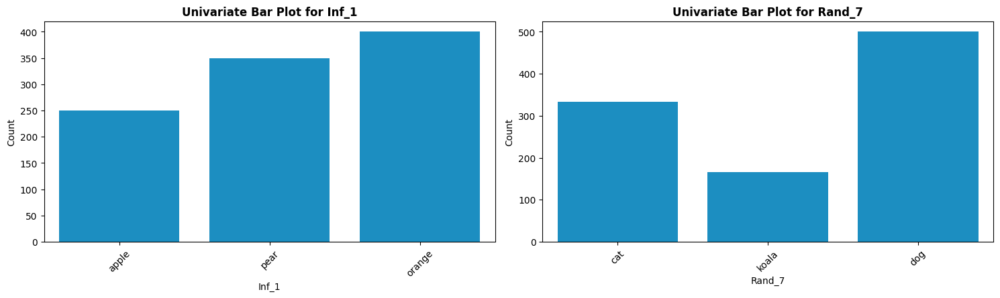

In [13]:
MLUtils.plot_cat_variables(X, cat_features,num_plots_per_row=2)

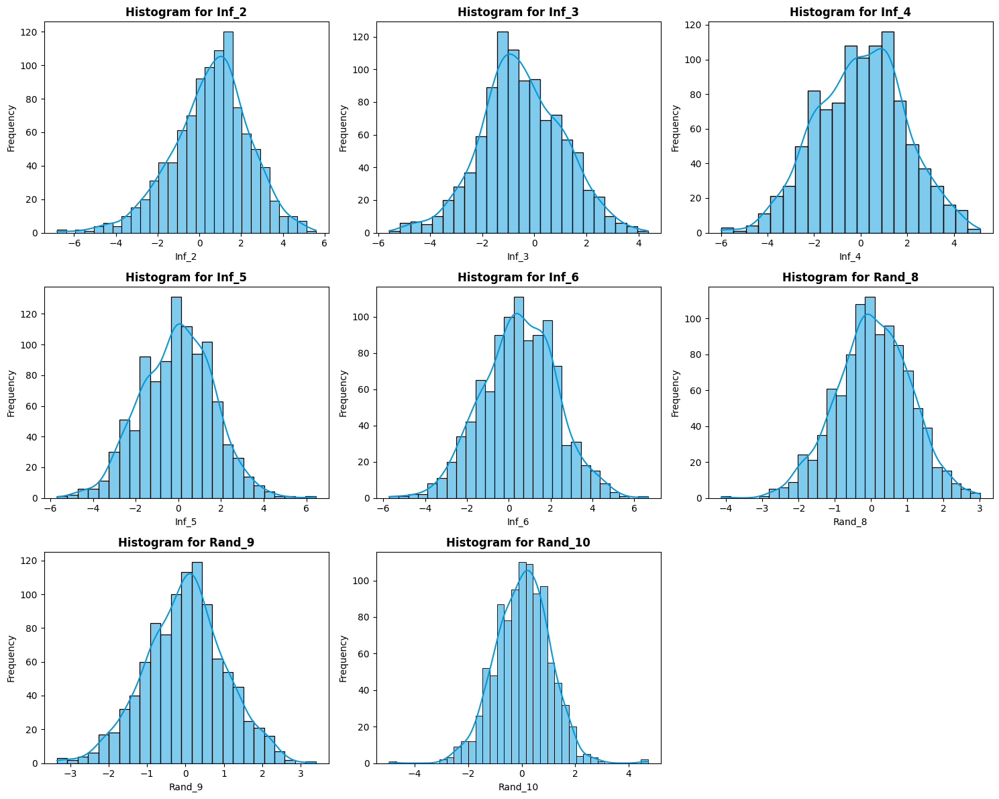

In [21]:
MLUtils.plot_num_variables(X, num_features, num_plots_per_row=3)

## EDA: Anomaly Highlights

Create scaterplots of all numerecial features pair, with cases of interests (e.g. anomalies) highlighted for diagnosis. 

### Create Data w/ Anomalies

In [15]:
X, y = make_classification(n_samples = n_samples, n_features = n_feature, 
                            n_informative = n_inform, n_redundant=n_redundant, shuffle=False)
informative_features_names = [f'inf_{i+1}' for i in range(n_inform)]
random_features_names = [f'rand_{i+n_inform+1}' for i in range(n_feature - n_inform)]
X = pd.DataFrame(X, columns = informative_features_names + random_features_names)

# Add 1% anomalies
anomaly_percentage = 0.01
num_anomalies = int(anomaly_percentage * n_samples)

# Randomly select indices for anomalies
anomaly_indices = np.random.choice(X.index, size=num_anomalies, replace=False)

# Modify values for anomalies (e.g., add some noise)
X.loc[anomaly_indices, informative_features_names] += np.random.normal(loc=0, scale=2, size=(num_anomalies, n_inform))
X.loc[anomaly_indices, random_features_names] += np.random.normal(loc=0, scale=2, size=(num_anomalies, n_feature - n_inform))



### Scatterplots with highlited anomalies

In [16]:
# label anomalies with a 0-1 list
anomalies = [0] * X.shape[0]
for index in anomaly_indices:
    anomalies[index] = 1

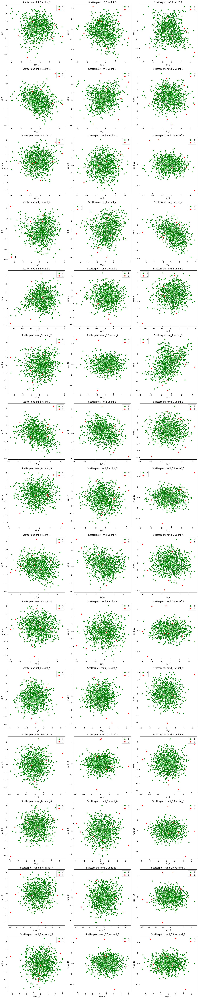

In [22]:

MLUtils.scatterplot_highlight(X, highlight=anomalies, num_plots_per_row=3)

### Define highlight with an anomaly detection algorithm

We can define highlight with whatever approach that suit our needs the most. From labeling some particular cases using case_id or index as we did above, or identify cases using some anomaly detection algorithm. Let's try Isolation Forest below. 

In [18]:
from sklearn.ensemble import IsolationForest

# Use Isolation Forest for anomaly detection
isolation_forest = IsolationForest(contamination=0.01)
isolation_forest.fit(X)

# Predict anomalies (outliers)
y_pred = isolation_forest.predict(X)
y_pred = np.where(y_pred==-1, 1, 0)

X does not have valid feature names, but IsolationForest was fitted with feature names


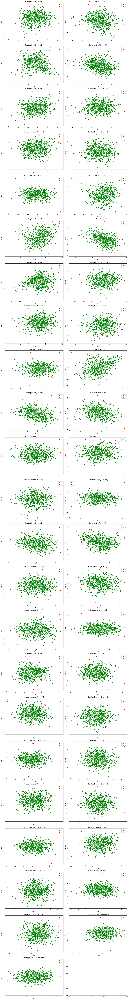

In [19]:
MLUtils.scatterplot_highlight(X,y_pred,num_plots_per_row=2)

# Backlog

* For scatterplot_highlight(), allow a default option of scatterplots with nothing to highlight